<div class="alert alert-info" role="alert">
  <hr> <center> <font color='darkcyan' size="+3.5"> <b> Interpréter des conditions atypiques à l'aide d'autoencodeurs variationnels conditionnels </b> </font> </center> <hr>
</div>

<div class="alert alert-block" role="alert">
    <center><b> <u>Auteur :</u>  Lorenzo HERMEZ  </b></center>
</div>
<div class="alert alert-block" role="alert">
    <center> <font size="+1.5"> <b>  16 mai 2022  </b>  </font> </center>
</div>

<div class="alert alert-info" role="alert">
  <font color='darkorange' size="+3."> <b> Interpréter des conditions atypiques à l'aide d'autoencodeurs variationnels conditionnels </b> </font> 
</div>

## <font color='DarkOrange'>0. Préparation de l'environnement de travail</font>
- chargement des modules
- mise en forme des données
- définition de quelques fonctions utiles

## <font color='DarkOrange'>1. Premier modèle CVAE</font>
- construction du modèle
- entrainement
- évaluation de la représentation obtenue
- premières interprétations

## <font color='DarkOrange'>2. Améliorer l'erreur de reconstruction à l'aide d'un deuxième décodeur</font>
- construction d'un deuxième décodeur
- entrainement sur les données encodées du CVAE
- évaluation de la représentation obtenue

## <font color='DarkOrange'>3. Améliorer l'erreur de reconstruction en bloquant les poids de l'encodeur au bout d'un nombre d'epochs.</font>
- chargement du CVAE initial, blocage des poids de l'encoder et restriction de la fonction de perte à la reconstruction.
- entrainement sur les données encodées du CVAE
- évaluation de la représentation obtenue

## <font color='DarkOrange'>4. Transformation des données encodées à l'aide d'une t-SNE</font>
- construction d'un deuxième décodeur pour décoder la sortie du t-SNE
- entrainement sur un t-SNE des données encodées
- évaluation de la représentation obtenue

## <font color='DarkOrange'>5. Transformation des données encodées à l'aide d'une ACP</font>
- construction d'un deuxième décodeur pour décoder la sortie de l'ACP
- entrainement sur une ACP des données encodées
- évaluation de la représentation obtenue

## <font color='DarkOrange'>6. Améliorer l'erreur de reconstruction en apprenant une ACP des données d'entrée</font>
- construction du modèle
- entrainement
- évaluation de la représentation obtenue
- premières interprétations

## <font color='DarkOrange'>7. Comparaisons et conclusions</font>
- Comparaison de la RMSE, MAE et MAPE sur le jeu de données d'entraînement 
- Comparaison de la RMSE, MAE et MAPE sur le jeu de données de test
- Conclusions


<div class="alert alert-info" role="alert">
    <font color='DarkOrange' size="+2"> <b> 0. Preparation de l'environnement de travail </b> </font> <hr>
</div>

# Chargement des modules et mise en forme des données

In [1]:
#import external libraries
import sys
import os


import datetime
import pandas as pd
import numpy as np
import pickle
from matplotlib import pyplot as plt
import seaborn as sn
from scipy import stats
import cv2 #from open-cv, to convert array to images
from IPython.display import Image
from tensorflow.keras.callbacks import TensorBoard
from time import time
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore')

2022-06-02 13:53:37.851159: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-06-02 13:53:37.851202: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
#root git folder 
path_second_folder = %pwd #"/home/hermezlor/Documents/VAE/"
save_path = os.path.join(path_second_folder,"Results/Reconstruction_loss")
log_dir_model=os.path.join(save_path,"logs")

#add  to path root git folder 
sys.path.append(path_second_folder)

In [3]:
import importlib

sys.path.append(path_second_folder+'/src')

#import models, loss_class, params_class,AE_blocks,metrics
from src.models import *
#importlib.reload(models)
from src.loss_class import *
#importlib.reload(loss_class)
from src.params_class import *
#importlib.reload(params_class)
import src.AE_blocks
#importlib.reload(AE_blocks)
from src.metrics import *
#importlib.reload(metrics)
from src.utils import *
from intel_functions import *

%load_ext autoreload
%autoreload 2


2022-06-02 13:53:41.845625: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-06-02 13:53:41.845664: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-06-02 13:53:41.845690: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (gm0winl472.bureau.si.interne): /proc/driver/nvidia/version does not exist
2022-06-02 13:53:41.846636: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Les données de consommation et de température sont des prises de mesure par pas de temps 30 minutes pendant 5 années de décembre 2012 à décembre 2020. 

In [4]:
# Load dataframe
dataset_csv = os.path.join('data', "dataset_2012_2020.csv")
df_data = pd.read_csv(dataset_csv, sep=";",)
df_data.utc_datetime = pd.to_datetime(df_data.utc_datetime, utc=True)

#Visualize data frame head
df_data.tail(5)

,utc_datetime,Consommation,prevision_j,prevision_j-1,prevision_neb,prevision_temp,is_holidays
157819,2020-12-31 21:30:00+00:00,64423.0,63700.0,64400.0,3.400764,2.328079,0.0
157820,2020-12-31 22:00:00+00:00,63505.0,63200.0,63800.0,3.479000,2.164250,0.0
157821,2020-12-31 22:30:00+00:00,64331.0,65200.0,65800.0,3.490986,2.029558,0.0
157822,2020-12-31 23:00:00+00:00,66853.0,67000.0,67500.0,3.369000,1.950550,0.0
157823,2020-12-31 23:30:00+00:00,66750.0,67200.0,67600.0,3.045322,1.953771,0.0


On s'intéresse ici à caractériser les profils journaliers. L'ensemble de données est donc transformé pour que notre jeu d'entrée soit ait en colonnes les points de mesure journaliers de la consommation d'électricité. Avant cela, tout ce qui va être inséré comme entrées du modèle est ici normalisé sur l'ensemble des mesures, puis mis en profils journaliers.

Notre jeu d'entrainement et pour référence est le jeu de données 2012-2018.

In [5]:
ds = pd.DataFrame({"days" : df_data.utc_datetime.dt.date, "minute":df_data.utc_datetime.dt.minute+60*df_data.utc_datetime.dt.hour})

df_conso, df_temp, df_prevision = make_chronics(df=pd.concat([df_data, ds], axis=1),
                                               toshape_columns=["Consommation", "prevision_temp", "prevision_j-1"],
                                               pivot_indexcol="days", pivot_columncol="minute")

df_conso.head()

minute,0,30,60,90,120,150,180,210,240,270,...,1140,1170,1200,1230,1260,1290,1320,1350,1380,1410
days,,,,,,,,,,,,,,,,,,,,,
2012-01-01,58315.0,58315.0,56231.0,56075.0,55532.0,54911.0,52496.0,50664.0,49161.0,47596.0,...,57333.0,57786.0,57752.0,56946.0,56054.0,54975.0,53890.0,54348.0,56577.0,55634.0
2012-01-02,55164.0,53643.0,51404.0,50842.0,50399.0,50113.0,48201.0,47182.0,46306.0,46294.0,...,73263.0,72615.0,71079.0,69050.0,67435.0,65332.0,63756.0,64030.0,65929.0,64902.0
2012-01-03,64600.0,63033.0,60533.0,60426.0,60104.0,59861.0,57915.0,56691.0,55743.0,55656.0,...,76698.0,75660.0,73535.0,71275.0,69189.0,66829.0,64861.0,64898.0,66939.0,65479.0
2012-01-04,65081.0,63129.0,60564.0,60194.0,59709.0,59353.0,57569.0,56545.0,55655.0,55628.0,...,78337.0,77173.0,75281.0,72985.0,70927.0,68726.0,66808.0,66878.0,68550.0,67376.0
2012-01-05,67042.0,65123.0,62447.0,62331.0,61889.0,61501.0,59574.0,58245.0,57258.0,56923.0,...,78351.0,76928.0,74868.0,72432.0,70197.0,68036.0,66269.0,66070.0,68169.0,66910.0


In [6]:
df_conso, conso_scaler = apply_scaler(df_data, column="Consommation", df_chronic=df_conso,
                                      reference_window=df_data.utc_datetime.dt.year <=2018)
df_conso.head()

minute,0,30,60,90,120,150,180,210,240,270,...,1140,1170,1200,1230,1260,1290,1320,1350,1380,1410
days,,,,,,,,,,,,,,,,,,,,,
2012-01-01,0.306926,0.306926,0.135886,0.123082,0.078516,0.027549,-0.170658,-0.321017,-0.444373,-0.572818,...,0.226330,0.263510,0.260719,0.194568,0.121359,0.032801,-0.056248,-0.018659,0.164283,0.086888
2012-01-02,0.048313,-0.076520,-0.260282,-0.306408,-0.342766,-0.366239,-0.523163,-0.606796,-0.678692,-0.679677,...,1.533758,1.480575,1.354510,1.187984,1.055435,0.882835,0.753487,0.775975,0.931833,0.847543
2012-01-03,0.822757,0.694148,0.488965,0.480183,0.453756,0.433812,0.274097,0.173639,0.095834,0.088693,...,1.815680,1.730488,1.556082,1.370597,1.199392,1.005699,0.844178,0.847215,1.014727,0.894900
2012-01-04,0.862234,0.702027,0.491509,0.461142,0.421337,0.392118,0.245700,0.161657,0.088611,0.086395,...,1.950198,1.854665,1.699382,1.510942,1.342035,1.161392,1.003975,1.009720,1.146947,1.050593
2012-01-05,1.023180,0.865682,0.646053,0.636533,0.600256,0.568412,0.410257,0.301181,0.220175,0.192680,...,1.951348,1.834557,1.665486,1.465555,1.282122,1.104761,0.959738,0.943405,1.115677,1.012347


'df_conso' est constitué des profils journaliers de consommation d'lélectricité que l'on va mettre en entrée de notre VAE

Pour interpréter notre représentation, on peut chercher à visualiser des paramètres connus associés à nos profils journaliers. Ici il s'agit notamment de données calendaires (mois, weekend, jour férié), auxquels on peut rajouter la température moyenne observée sur la journée (par exemple), ou encore la pente moyenne du profil.

Ces informations sont à passer dans calendar_info pour être visualisés dans une projection Tensorboard, et à passer en type et en valeur respectivement dans le dictionnaire factorDesc et factorMatrix pour servir dans l'évaluation des latents. 

In [7]:
#importation des données calendaires
df_calendar = make_df_calendar(pd.DataFrame({"ds" : pd.to_datetime(np.asarray(df_conso.index))}))

df_holidays = pd.concat([df_data[["is_holidays"]],pd.DataFrame({"ds" : pd.to_datetime(ds.days.values)})], axis=1).drop_duplicates(
                                               subset="ds").reset_index(drop= True)

df_calendar = df_calendar.merge(df_holidays, on="ds", how="left").rename(columns={"is_holidays":"is_holiday_day"})

df_calendar.head(5)

,ds,month,weekday,is_weekend,year,is_holiday_day
0,2012-01-01,1,6,1,2012,1.0
1,2012-01-02,1,0,0,2012,0.0
2,2012-01-03,1,1,0,2012,0.0
3,2012-01-04,1,2,0,2012,0.0
4,2012-01-05,1,3,0,2012,0.0


In [8]:
#explicit the potential bridge days taken as extended holidays
day_hol = df_calendar[['weekday', 'is_holiday_day']].copy().values
bridge_index=[]
for i in range(day_hol.shape[0]):
    if day_hol[i,1]==1:
        if day_hol[i,0]==1:
            bridge_index.append(i-1)
        elif day_hol[i,0]==3:
            bridge_index.append(i+1)

bridges = np.zeros(day_hol.shape[0])
bridges[np.asarray(bridge_index)] = 1

df_calendar['potential_bridge_holiday'] = bridges
#calendar_info['potential_bridge_holiday'].describe()

In [9]:
calendar_factors = ["weekday", "is_weekend", "month", "is_holiday_day"]
factors = df_calendar[calendar_factors].copy()
factorDesc = {ff : 'category' for ff in calendar_factors}

temperatureMean= df_temp.mean(axis=1).values.reshape(-1,1)
factorMatrix = np.c_[factors.values,temperatureMean]
factorDesc['temperature']='regressor'


# Tools to evaluate the representations

In [10]:
from math import cos, sin
#visualisation d'une représentation 2D dans le notebook
def prez_2D(x_encoded, factorMatrix, temperatureMean, months=True):
    proj2D = PCA(2)
    proj = proj2D.fit_transform(x_encoded)
    plt.figure(figsize=(36,18))
    
    #visualisation des mois par un disque de fond coloré
    if months:
        for i in np.unique(factorMatrix[:,0]):
            i = int(i)
            index = factorMatrix[:,0]==i
            plt.scatter(x=proj[index,0], y=proj[index,1], c= factorMatrix[index,2], marker = 'o', s=500, alpha=0.5, cmap = 'Paired')

        plt.colorbar().set_label('month');
    
    #visualisation de la température par la coloration graduelle du jour de la semaine
    for i in np.unique(factorMatrix[:,0]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= temperatureMean[index].ravel(), marker = '$'+str(i)+'$', s=200, cmap='viridis')

    plt.colorbar().set_label('temperature');
    
def prez_3D(x_encoded, factorMatrix, temperatureMean):
    proj3D = PCA(3)
    proj_z = proj3D.fit_transform(x_encoded)
    plt.figure(figsize=(36,18))
    
    proj = proj_z[:,:2]
    third = proj_z[:,2]
    
    proj = proj + np.tile(third.reshape(-1,1), (1,2)) * np.tile(np.array([[-cos(0.785),sin(0.785)]]),(nPoints,1))
    
    size = 300  + (1.- np.exp(-third / max(third))) * 800
    #visualisation des mois par un disque de fond coloré
    for i in np.unique(factorMatrix[:,1]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= factorMatrix[index,2], marker = 'o', s=size, alpha=0.5, cmap = 'Paired')

    plt.colorbar().set_label('month');
    
    #visualisation de la température par la coloration graduelle du jour de la semaine
    for i in np.unique(factorMatrix[:,1]):
        i = int(i)
        index = factorMatrix[:,0]==i
        plt.scatter(x=proj[index,0], y=proj[index,1], c= temperatureMean[index], marker = '$'+str(i)+'$', s=200)

    plt.colorbar().set_label('temperature');

Pour créer une représentation sous tensorboard, la fonction suivante regroupe toutes les étapes. Le booléen includeConsuptionProfileImages active ou non le marqueur des points à l'image des profils de consommation.

In [11]:
def tensorboardProjection(name_model,x, x_hat, x_encoded, x_conso, calendar_info, log_dir_projector, includeConsumptionProfileImages=True):
    #can take a bit longer to create and load in tensorboard projector, but it looks better in the projector
    if includeConsumptionProfileImages:
        nPoints=1500 #if you want to visualize images of consumption profiles and its recontruction in tensorboard, there is a maximum size that can be handle for a sprite image. 1830 is  
        x_encoded_reduced=x_encoded[0:nPoints,]
        images=createLoadProfileImages(x,x_hat,nPoints)
    else:
        nPoints=df_conso.shape[0]
        
    if includeConsumptionProfileImages:
        sprites=images_to_sprite(images)
        cv2.imwrite(os.path.join(log_dir_projector, 'sprite_4_classes.png'), sprites)
    
    writeMetaData(log_dir_projector,x_conso,calendar_info,nPoints,has_Odd=False)
    if includeConsumptionProfileImages:
        buildProjector(x_encoded_reduced,images=images, log_dir=log_dir_projector)
    else:
        buildProjector(x_encoded,images=None, log_dir=log_dir_projector)
        
    print(log_dir_projector)

In [12]:
#Visualisation des courbes de charge en entrée et reconstruite par le modèle

def display_loads(x, x_hat,date,mae):
    fig = plt.figure(dpi=100,figsize=(5,5))
    #set(gca,'Color','k')
    plt.plot(scaler_conso.inverse_transform(x), label = 'truth')
    plt.plot(scaler_conso.inverse_transform(x_hat), '--', label = 'reconstruction')
    plt.title(date+' - mean absolute error %0.2f GW' %(mae*std_sc/1000))
    plt.xlabel('hours')
    plt.ylabel('load (MW)')
    plt.xlim((0,48))
    plt.xticks([5,11,17,23,29,35,41], [3,6,9,12,15,18,21])
    plt.legend(loc='lower right')
    plt.grid();

In [13]:
def plot_intel(intel_cvae, input_cvae):
    x_encoded = intel_cvae.encoder.predict(input_cvae)[0]
    model_eval, _ = evaluate_latent_code(x_encoded, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
    #normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
    display_evaluation_latent_code(model_eval, z_dim, factorDesc)
    prez_2D(x_encoded, factorMatrix[train_set,:], temperatureMean[train_set], months=True)
    data = {i: x_encoded[:,i] for i in range(x_encoded.shape[1])}
    data['weekday'] = df_calendar.weekday[train_set]
    z=pd.DataFrame(data=data)

    import seaborn as sns
    sns.set_theme(style="ticks")
    sns.pairplot(z, hue='weekday')

<div class="alert alert-info" role="alert">
    <font color='darkorange'size="+2"> <b> 1. Un modèle classique </b> </font> <hr>
</div>

## Rappels

Les autoencodeurs variationnels sont des modèles qui fonctionnent en duo:
- un encodeur qui traduit les données d'entrée dans un espace latent de dimension arbitrairement choisie. Plus exactement il cherche les paramètres de distribution des variables latentes dans chacune des dimensions.
- un decodeur qui cherche à reconstruire les entrées à partir des coordonnées dans l'espace latent

Pendant l'appentissage, le lien entre encodeur et decodeur est réalisé par l'échantillage selon les paramètres de distribution appris : chaque échantillon a des coordonnées latentes tirées aléatoirement selon cette dernière, que le décodeur cherche à retraduire dans l'espace de dimension initial. 

## Construire et entrainer un modèle VAE ou CVAE

Il s'agit dans un premier temps de paramétrer les dimensions des couches de nos réseaux de neurone:
- celles de l'encodeur e_dim
- celles du décodeur d_dims
- les dimensions de notre espace latent z_dim (chaque paramètre de distribution sera donc aussi de dimension z_dim)
- les dimensions de notre embedding des conditions dans le cas dans CVAE

In [15]:
# paramètres de l'autoencodeur
z_dim = 4 # le nombre de dimensions voulues dans notre représentation latente
e_dims=[48,34,24,12]# les couches cachées du bloc encodeur; premier nombre = inputs_dim
d_dims=[12,24,34,48]# les couches cachées du bloc decodeur; premier nombre = outputs_dim
lr=1e-4 # le learning rate de l'optimiseur
input_dim = df_conso.shape[1]

Pour les paramètres liés au modèle, il faut rappeler le fonctionnement du VAE. On cherche la maximisation de la borne inférieure de la log-vraissemblance du modèle reconstruit ou ELBO qui se décompose en deux termes :

ELBO $= \mathbb{E}_{q_\phi(z|x)} \log(p_\theta(x|z)) - KL(q_\phi(z|x) \| p(z))$

Dans notre objectif d'apprentissage, cela est traduit par une perte à minimiser de la forme:

Obj $= \|x - \hat{x}\| +  KL(q_\phi(z|x) \| p(z))$.

- L'erreur de reconstruction peut être choisie selon une mesure en norme L1 ou L2. La norme L1 permet notamment d'obtenir des profils avec moins de valeurs abérrantes.

- Un prior $p(z)$ laplacien plutôt que gaussien permet des concentrations plus piquées des groupements similaires, et renvoie plus loin les points atypiques. 


- Par ailleurs, pour faciliter l'apprentissage du modèle de façon structurée dans les dimensions choisies de l'espace latent, l'action peut se porter sur le choix du prior comme sur des critères de régularisation devant le terme de divergence.

    Ces termes de régularisation s'appliquent de la façon suivante :

    Obj $= \|x - \hat{x}\| +  \beta KL(q_\phi(z|x) \| p(z)) + \gamma MMD(q_\phi(z) \| p(z))$ si modèle InfoVAE
    avec $\beta \in \left[0,1\right] $ et $\gamma \ge 0$ (si possible grand)

In [16]:
# paramètres de l'entrainement du modèle
epochs = 1000
batch_size = 16

On va mettre en forme ici les facteurs sur lesquels on va rendre la représentation latente agnostique. Attention à normaliser les variables quantitatives et à one-hot encoder les variables catégorielles. 

In [17]:
#on va conditionner sur les profils de température et le mois
calendar_cond = []
condtovae_dims = []
condarray=[]

df_temp, _ = apply_scaler(df_data, column="prevision_temp", df_chronic=df_temp,
                                      reference_window=None)

condarray.append(df_temp.values)
condtovae_dims.append(condarray[-1].shape[1])

for cc in calendar_cond:
    condarray.append(pd.get_dummies(df_calendar[cc], prefix=cc).values)
    condtovae_dims.append(condarray[-1].shape[1])



In [18]:
train_set = df_calendar.year.values <= 2018
test_set = df_calendar.year.values == 2019

input_cvae = [df_conso.values[train_set,:]]
output_cvae = df_conso.values[train_set,:]

In [19]:
name_model="cvae_initial"
vae_params = VAE_params(name=name_model, out_dir = log_dir_model)

In [20]:
vae_params.set_model_params()
vae_params.set_training_params()

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  True
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003


In [23]:
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.latent_dims = z_dim
vae_params.model_params.cond_dims = []
vae_params.model_params.with_embedding = False
vae_params.model_params.emb_dims = [[48,24,12],[12, 6, 3],6]
vae_params.model_params.nb_encoder_ensemble = 1
vae_params.model_params.encoder_type = 'NNBlockCond_model'
vae_params.model_params.decoder_type = 'InceptionBlock_model'
vae_params.model_params.with_Time2Vec = False

In [45]:
np.log10(64)

1.806179973983887

In [54]:
loss_weights = {"recon_loss" : 1,
                "kl_loss" : 0.33,
                "info_loss" : 66}

vae_loss = VAELoss(loss_weights = loss_weights, recon_loss="mse") #change None to custom_loss if will to use one
vae_loss.options["log_prior_sigma"] = [np.log10(64, dtype='float32'), 1., 0., -1.]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = lr

cvae = CVAE(vae_params)
cvae.build_model(vae_params)

from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

Model: "cvae"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 x_inputs (InputLayer)          [(None, 48)]         0           []                               
                                                                                                  
 encoder (Functional)           [(None, 4),          5262        ['x_inputs[0][0]']               
                                 (None, 4)]                                                       
                                                                                                  
 reparametrizing_layer (Lambda)  (None, 4)           0           ['encoder[0][0]',                
                                                                  'encoder[0][1]']                
                                                                                               

## START TRAINING ##
Epoch 1/1000
144/144 [==============================] - 2s 5ms/step - loss: 33.3491 - val_loss: 22.6040
Epoch 2/1000
144/144 [==============================] - 0s 3ms/step - loss: 19.5718 - val_loss: 12.7899
Epoch 3/1000
144/144 [==============================] - 0s 3ms/step - loss: 11.8358 - val_loss: 8.1605
Epoch 4/1000
144/144 [==============================] - 0s 3ms/step - loss: 6.6706 - val_loss: 7.1938
Epoch 5/1000
144/144 [==============================] - 0s 3ms/step - loss: 5.6306 - val_loss: 5.6710
Epoch 6/1000
144/144 [==============================] - 0s 3ms/step - loss: 5.2012 - val_loss: 5.1280
Epoch 7/1000
144/144 [==============================] - 0s 3ms/step - loss: 4.8401 - val_loss: 4.8231
Epoch 8/1000
144/144 [==============================] - 0s 3ms/step - loss: 4.6056 - val_loss: 4.2203
Epoch 9/1000
144/144 [==============================] - 0s 3ms/step - loss: 4.3463 - val_loss: 4.1454
Epoch 10/1000
144/144 [==============================] -

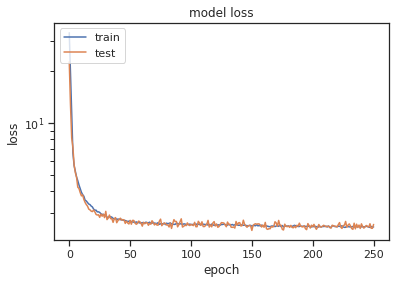

## MODEL SAVED ##


In [55]:
cvae.train(input_cvae, output_cvae, epochs= 1000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop])


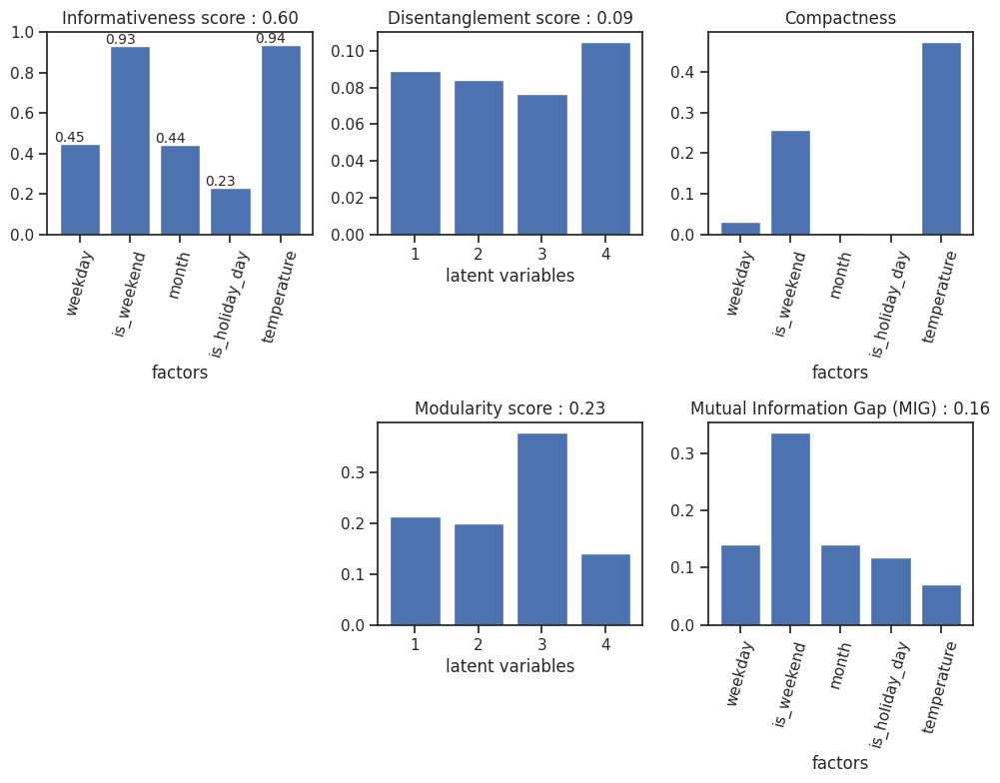

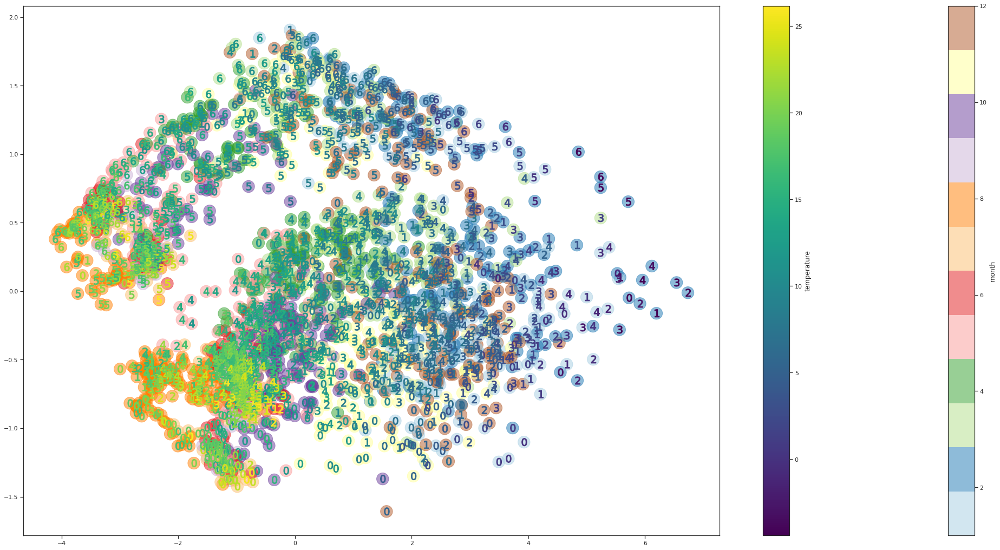

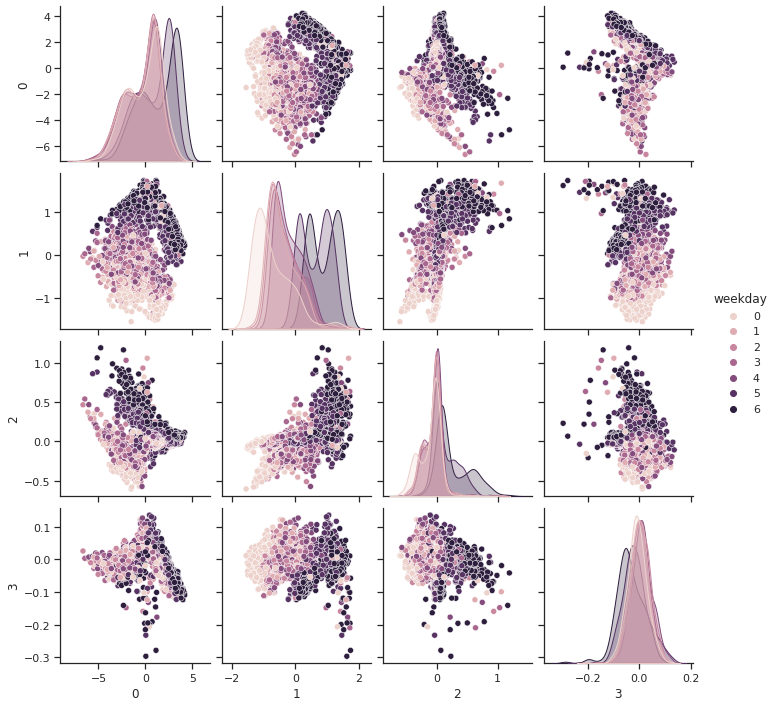

In [56]:
plot_intel(cvae, input_cvae)

### Voyons à quoi ressemble les données d'entrées grâce à une Analyse en Composantes Principales (ACP)

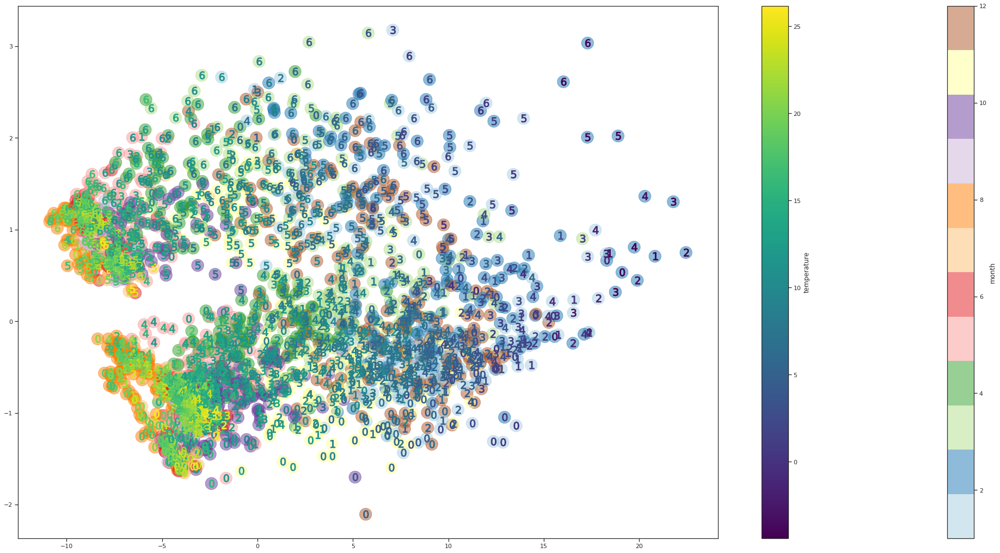

In [57]:
pca_model= PCA(z_dim)
z_pca = pca_model.fit_transform(input_cvae[0])
prez_2D(z_pca, factorMatrix[train_set,:], temperatureMean[train_set,:])

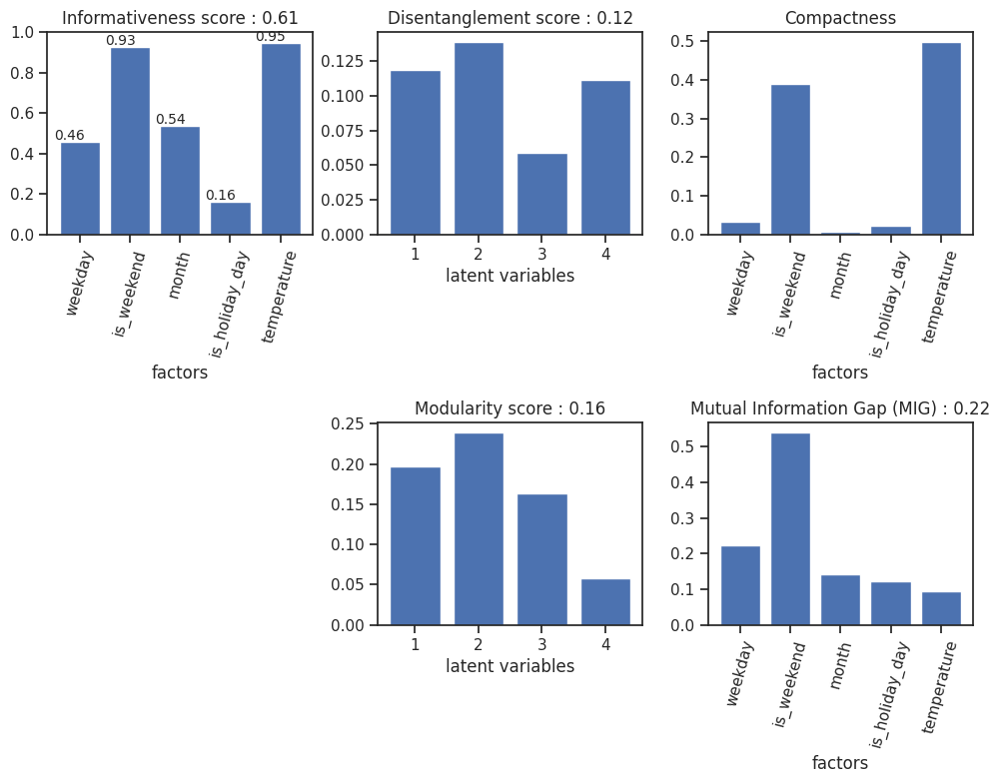

In [58]:
model_eval, _ = evaluate_latent_code(z_pca, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval, z_dim, factorDesc)

## <font color='DarkOrange'>2. Améliorer l'erreur de reconstruction à l'aide d'un deuxième décodeur</font>

In [60]:
dec_inputs = Input(shape=(cvae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(cvae.VAE_params.model_params.decoder_dims):
    if (idx<len(cvae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    
decoder_initial2 = Model(inputs=dec_inputs, outputs=x, name=name_model+'2nd_dec')
    

In [62]:
from tensorflow.keras import losses

optimizer = cvae.VAE_params.training_params.optimizer(cvae.VAE_params.training_params.lr)

decoder_initial2.compile(loss=cvae.VAE_params.training_params.loss.losses["recon_loss"],
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)

In [63]:
x_encoded = cvae.encoder.predict(input_cvae)[0]

In [64]:
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

training_history = decoder_initial2.fit(x_encoded, output_cvae, epochs= 1000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/1000
144/144 [==============================] - 1s 2ms/step - loss: 15.3150 - val_loss: 11.1289
Epoch 2/1000
144/144 [==============================] - 0s 2ms/step - loss: 12.8430 - val_loss: 8.3295
Epoch 3/1000
144/144 [==============================] - 0s 2ms/step - loss: 9.4295 - val_loss: 4.9625
Epoch 4/1000
144/144 [==============================] - 0s 2ms/step - loss: 5.7008 - val_loss: 2.3711
Epoch 5/1000
144/144 [==============================] - 0s 2ms/step - loss: 2.9726 - val_loss: 1.2410
Epoch 6/1000
144/144 [==============================] - 0s 2ms/step - loss: 1.6275 - val_loss: 0.8214
Epoch 7/1000
144/144 [==============================] - 0s 2ms/step - loss: 1.0349 - val_loss: 0.6498
Epoch 8/1000
144/144 [==============================] - 0s 2ms/step - loss: 0.7813 - val_loss: 0.5585
Epoch 9/1000
144/144 [==============================] - 0s 2ms/step - loss: 0.6594 - val_loss: 0.4912
Epoch 10/1000
144/144 [==============================] - 0s 2ms/step - loss: 0.

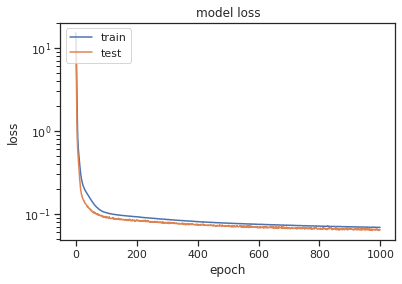

In [65]:
plt.plot(training_history.history['loss'])
plt.plot(training_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## <font color='DarkOrange'>3. Améliorer l'erreur de reconstruction en bloquant les poids de l'encodeur au bout d'un nombre d'epochs.</font>


Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  True
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
{'with_embedding': False, 'with_Time2Vec': True, 'emb_dims': [], 'kernel_initializer': 'glorot_uniform', 'bi

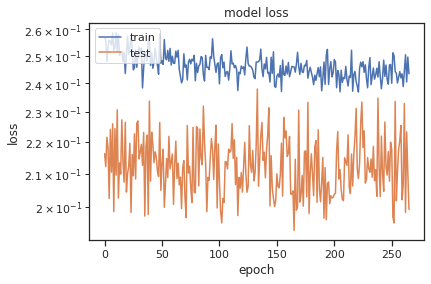

## MODEL SAVED ##


In [66]:
vae_params2 = VAE_params(name=name_model, out_dir = log_dir_model)
vae_params2.set_model_params()
vae_params2.set_training_params()
vae_params2.model_params.encoder_dims = e_dims
vae_params2.model_params.decoder_dims = d_dims
vae_params2.model_params.latent_dims = z_dim
vae_params2.model_params.cond_dims = []
vae_params2.model_params.with_embedding = False
vae_params2.model_params.nb_encoder_ensemble = 1

from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)
print(vae_params2.model_params.__dict__)
#example of custom loss definition
loss_weights = {"recon_loss" : 1}

vae_loss = VAELoss(loss_weights = loss_weights) #change None to custom_loss if will to use one
vae_loss.options["log_prior_sigma"] = [-2., -1., 0., 1.]

vae_params2.training_params.loss = vae_loss
vae_params2.training_params.lr = lr


intel_cvae2 = CVAE(vae_params2)
intel_cvae2.load_model(training_params=vae_params2.training_params)
intel_cvae2.maketrainable(modelpart=['encoder'], boolean=False)
intel_cvae2.train(input_cvae, output_cvae, epochs= 1000, verbose=1,
            batch_size=batch_size, callbacks=[earl_stop])

## <font color='DarkOrange'>4. Transformation des données encodées à l'aide d'un t-SNE</font>


### t-SNE des données encodées avec le CVAE

In [67]:
from sklearn.manifold import TSNE

tsne = TSNE(z_dim, method='exact')
z_tsne = tsne.fit_transform(x_encoded)

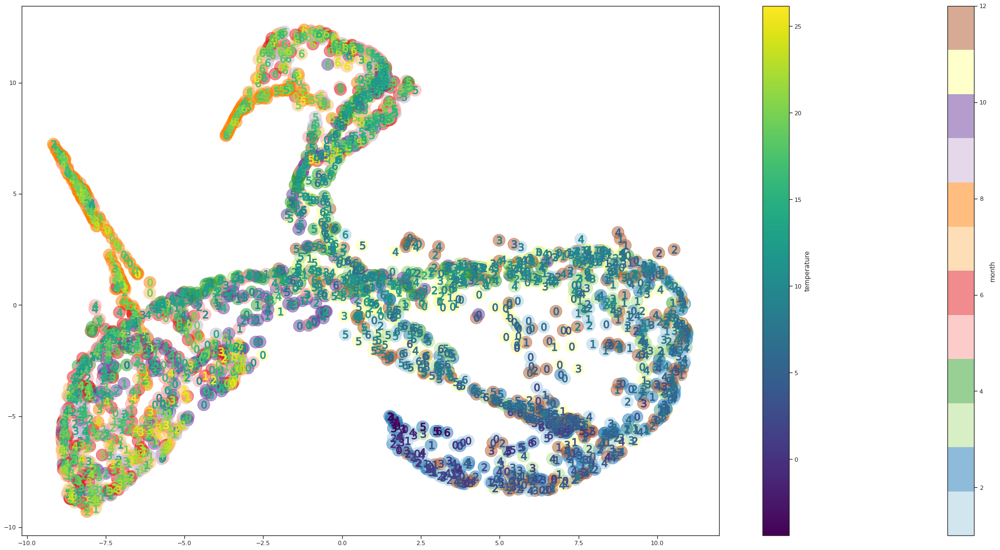

In [68]:
prez_2D(z_tsne, factorMatrix[train_set,:], temperatureMean[train_set,:])

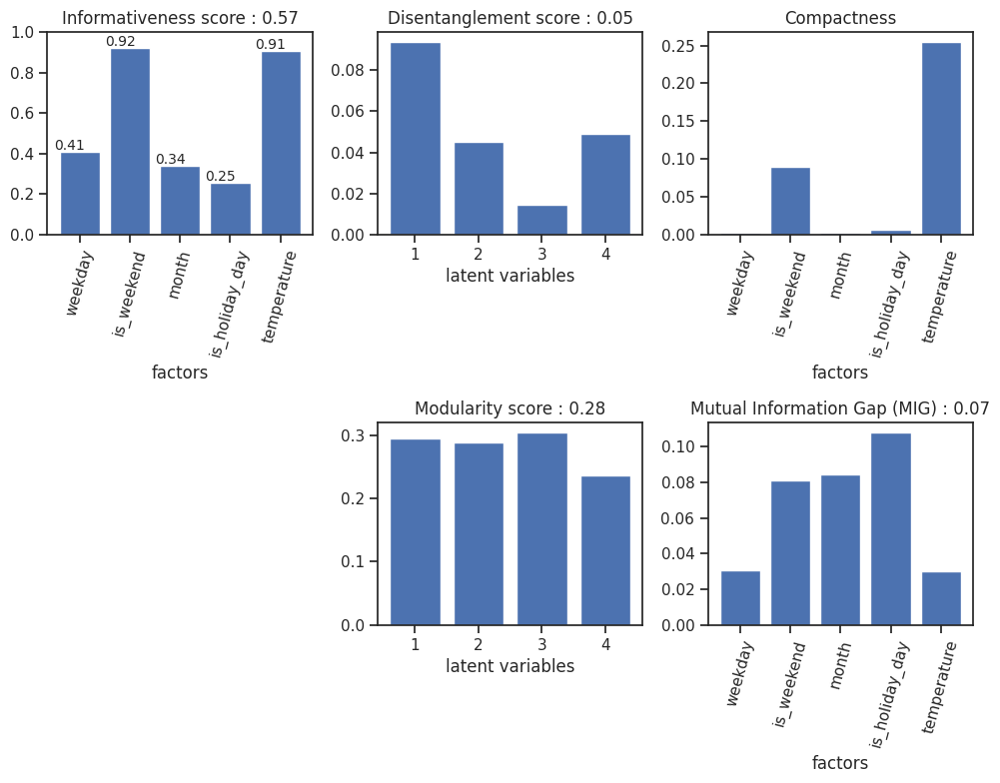

In [69]:
model_eval, _ = evaluate_latent_code(z_tsne, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval, z_dim, factorDesc)

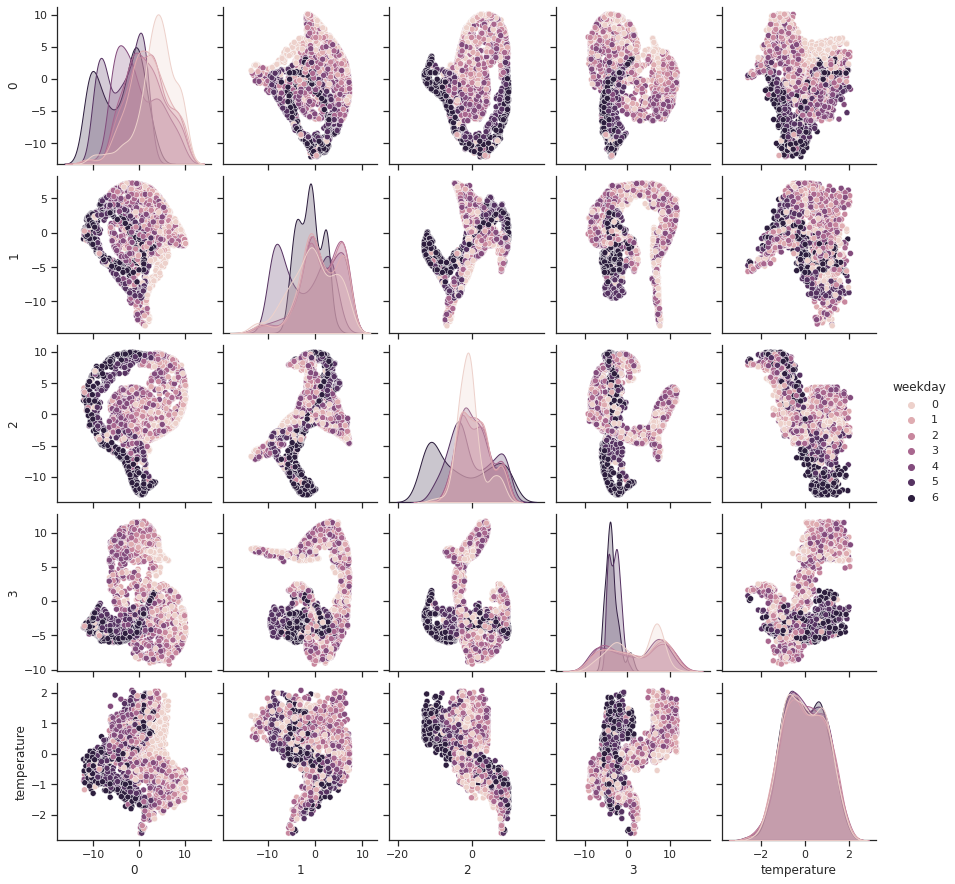

In [70]:
data = {i: z_tsne[:,i] for i in range(z_tsne.shape[1])}
data['temperature'] = df_temp[train_set].mean(axis=1).values
data['weekday'] = df_calendar.weekday[train_set]
z=pd.DataFrame(data=data)

import seaborn as sns
sns.set_theme(style="ticks")
sns.pairplot(z, hue='weekday')

### Apprentissage d'un décodeur pour décoder le t-SNE des données

In [71]:
dec_inputs = Input(shape=(cvae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(cvae.VAE_params.model_params.decoder_dims):
    if (idx<len(cvae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    
decoder_tsne = Model(inputs=dec_inputs, outputs=x, name=name_model+'tsne_dec')

In [72]:
from tensorflow.keras import losses

optimizer = cvae.VAE_params.training_params.optimizer(cvae.VAE_params.training_params.lr)

decoder_tsne.compile(loss=cvae.VAE_params.training_params.loss.losses["recon_loss"],
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)

In [73]:
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)
training_history_tsne = decoder_tsne.fit(z_tsne, output_cvae, epochs= 1000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/1000
144/144 [==============================] - 0s 2ms/step - loss: 29.5196 - val_loss: 20.5442
Epoch 2/1000
144/144 [==============================] - 0s 1ms/step - loss: 20.4853 - val_loss: 15.3393
Epoch 3/1000
144/144 [==============================] - 0s 1ms/step - loss: 16.6683 - val_loss: 12.4295
Epoch 4/1000
144/144 [==============================] - 0s 990us/step - loss: 14.1709 - val_loss: 10.3073
Epoch 5/1000
144/144 [==============================] - 0s 1ms/step - loss: 11.8444 - val_loss: 8.2342
Epoch 6/1000
144/144 [==============================] - 0s 1ms/step - loss: 8.8917 - val_loss: 5.5009
Epoch 7/1000
144/144 [==============================] - 0s 1ms/step - loss: 5.8135 - val_loss: 3.2614
Epoch 8/1000
144/144 [==============================] - 0s 1ms/step - loss: 3.8036 - val_loss: 2.1894
Epoch 9/1000
144/144 [==============================] - 0s 1ms/step - loss: 2.7894 - val_loss: 1.6910
Epoch 10/1000
144/144 [==============================] - 0s 1ms/step - 

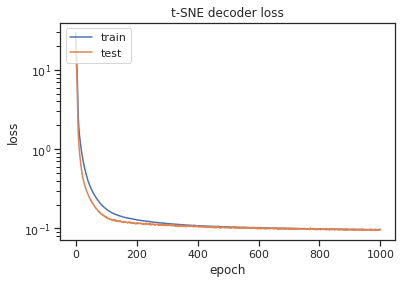

In [74]:
plt.plot(training_history_tsne.history['loss'])
plt.plot(training_history_tsne.history['val_loss'])
plt.title('t-SNE decoder loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## <font color='DarkOrange'>5. Transformation des données encodées à l'aide d'une ACP</font>


### ACP des données encodées avec le CVAE

In [75]:
from sklearn.decomposition import PCA

pca = PCA(z_dim)
z_pca = pca.fit_transform(x_encoded)

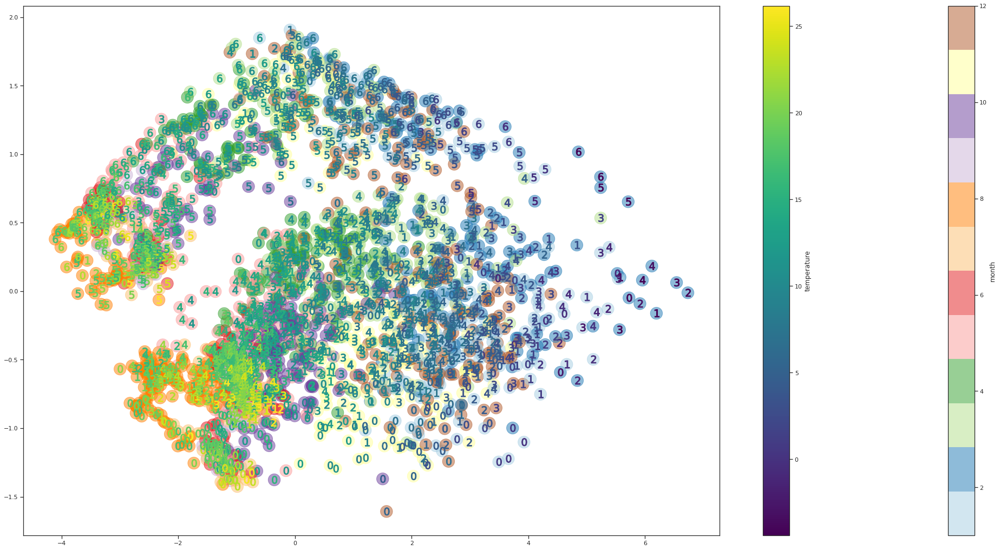

In [76]:
prez_2D(z_pca, factorMatrix[train_set,:], temperatureMean[train_set,:])

On remarque que la sortie de la fonction prez_2D est la même sur les données encodées et sur l'ACP des données encodées. Cela est tout à fait normal puisque cette fonction réalise une ACP afin d'afficher les 2 axes ayant les plus grandes variances (captant le plus d'informations). Il est donc normal que les deux représentations soient identiques car elles représentent, toutes les deux, les deux premiers axes de l'ACP des données encodées.

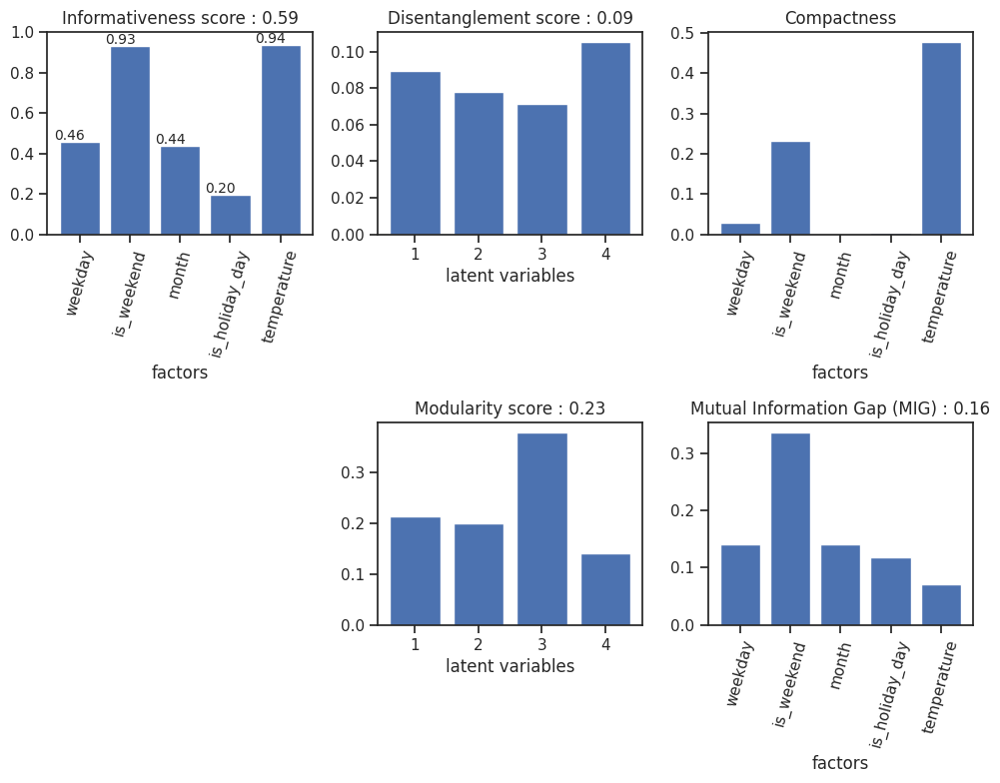

In [77]:
model_eval, _ = evaluate_latent_code(z_pca, factorMatrix[train_set,:], factorDesc, orthogonalize=True, normalize_information=True)
#normalize_information normalise le score avec le minimum obtenu avec une projection aléatoire
display_evaluation_latent_code(model_eval, z_dim, factorDesc)

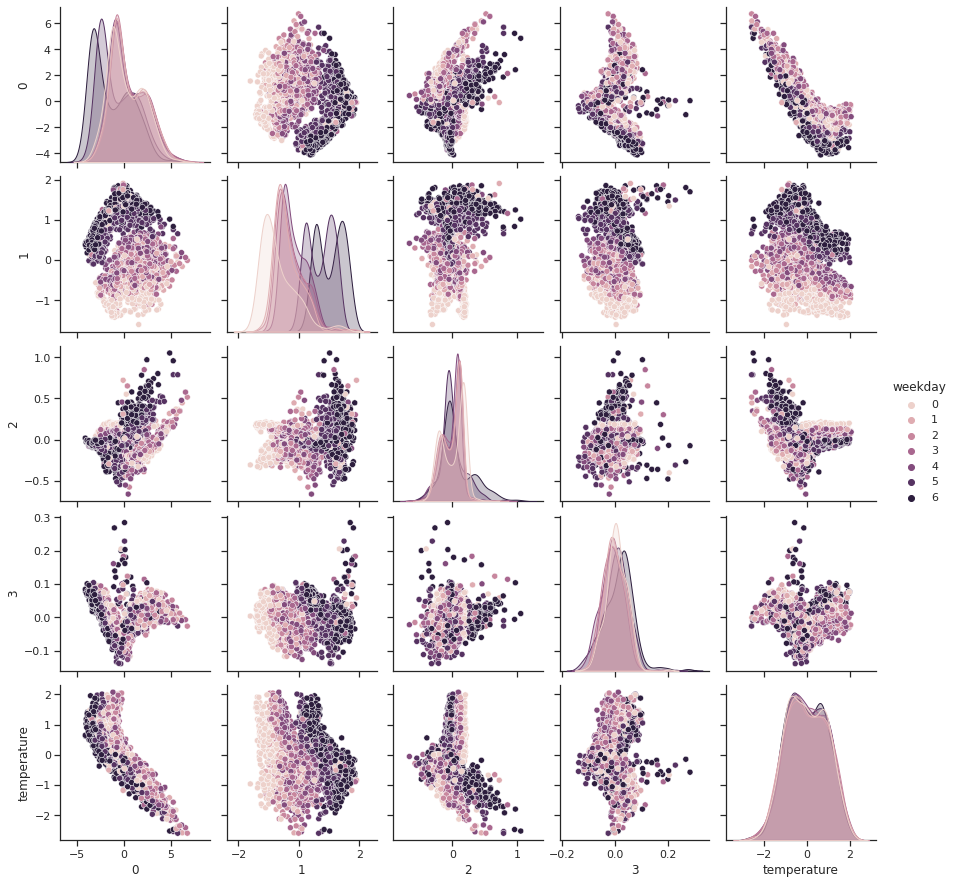

In [78]:
data = {i: z_pca[:,i] for i in range(z_pca.shape[1])}
data['temperature'] = df_temp[train_set].mean(axis=1).values
data['weekday'] = df_calendar.weekday[train_set]
z=pd.DataFrame(data=data)

import seaborn as sns
sns.set_theme(style="ticks")
sns.pairplot(z, hue='weekday')

### Apprentissage d'un décodeur pour décoder l'ACP des données

In [79]:
dec_inputs = Input(shape=(cvae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(cvae.VAE_params.model_params.decoder_dims):
    if (idx<len(cvae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    
decoder_pca = Model(inputs=dec_inputs, outputs=x, name=name_model+'pca_dec')

In [80]:
from tensorflow.keras import losses

optimizer = cvae.VAE_params.training_params.optimizer(cvae.VAE_params.training_params.lr)

decoder_pca.compile(loss=cvae.VAE_params.training_params.loss.losses["recon_loss"],
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)

In [81]:
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)
training_history_pca = decoder_pca.fit(z_pca, output_cvae, epochs= 1000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/1000
144/144 [==============================] - 0s 2ms/step - loss: 16.7397 - val_loss: 12.5342
Epoch 2/1000
144/144 [==============================] - 0s 1ms/step - loss: 13.2651 - val_loss: 10.4194
Epoch 3/1000
144/144 [==============================] - 0s 1ms/step - loss: 9.4674 - val_loss: 7.7213
Epoch 4/1000
144/144 [==============================] - 0s 1ms/step - loss: 5.8264 - val_loss: 4.9019
Epoch 5/1000
144/144 [==============================] - 0s 1ms/step - loss: 3.2261 - val_loss: 2.7482
Epoch 6/1000
144/144 [==============================] - 0s 1ms/step - loss: 1.8069 - val_loss: 1.5691
Epoch 7/1000
144/144 [==============================] - 0s 1ms/step - loss: 1.1788 - val_loss: 1.0358
Epoch 8/1000
144/144 [==============================] - 0s 974us/step - loss: 0.9212 - val_loss: 0.8146
Epoch 9/1000
144/144 [==============================] - 0s 1ms/step - loss: 0.7922 - val_loss: 0.6807
Epoch 10/1000
144/144 [==============================] - 0s 1ms/step - loss:

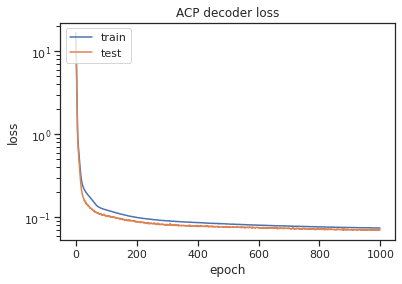

In [82]:
plt.plot(training_history_pca.history['loss'])
plt.plot(training_history_pca.history['val_loss'])
plt.title('ACP decoder loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## <font color='DarkOrange'>6. Améliorer l'erreur de reconstruction en apprenant une ACP des données d'entrée</font>

Default values for model architecture are:
with_embedding  :=  False
with_Time2Vec  :=  True
emb_dims  :=  []
kernel_initializer  :=  glorot_uniform
bias_initializer  :=  glorot_uniform
reparametrize  :=  GaussianSampling
intel_function  :=  scalar_binary
input_dims  :=  48
output_dims  :=  48
t2v_dims  :=  12
latent_dims  :=  4
nb_latent_components  :=  2
nb_encoder_ensemble  :=  1
encoder_dims  :=  [12, 10, 8, 6]
encoder_type  :=  NNBlockCond_model
nb_decoder_outputs  :=  1
nb_decoder_ensemble  :=  1
decoder_dims  :=  [6, 12, 24, 48]
latent_encoder_dims  :=  [4, 3, 3, 4]
latent_mask  :=  0
decoder_type  :=  InceptionBlock_model
embedding_type  :=  EmbeddingBlock_model
cond_dims  :=  []
cond_insert  :=  {'encoder': [], 'decoder': []}
context_dims  :=  None
leapae_dims  :=  [4, None]
Default parameters for training are a L2 loss with Adam optimizer with a learning rate of 0.0003
Model: "cvae"
______________________________________________________________________________________________

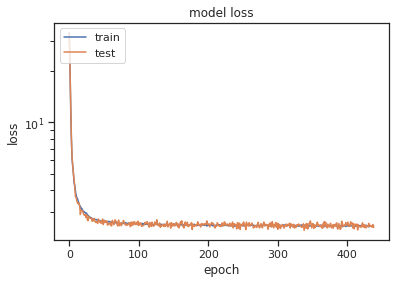

## MODEL SAVED ##


In [87]:
name_model="cvae_pca_first"
vae_params = VAE_params(name=name_model, out_dir = log_dir_model)
vae_params.set_model_params()
vae_params.set_training_params()
vae_params.model_params.encoder_dims = e_dims
vae_params.model_params.decoder_dims = d_dims
vae_params.model_params.latent_dims = z_dim
vae_params.model_params.cond_dims = []
vae_params.model_params.with_embedding = False
vae_params.model_params.emb_dims = [[48,24,12],[12, 6, 3],6]
vae_params.model_params.nb_encoder_ensemble = 1
vae_params.model_params.encoder_type = 'NNBlockCond_model'
vae_params.model_params.decoder_type = 'InceptionBlock_model'
vae_params.model_params.with_Time2Vec = False
loss_weights = {"recon_loss" : 1,
                "kl_loss" : 0.33,
                "info_loss" : 66}

vae_loss = VAELoss(loss_weights = loss_weights, recon_loss="mse") #change None to custom_loss if will to use one
vae_loss.options["log_prior_sigma"] = [np.log10(64, dtype='float32'), 1., 0., -1.]

vae_params.training_params.loss = vae_loss
vae_params.training_params.lr = lr

cvae_pca = CVAE(vae_params)
cvae_pca.build_model(vae_params)

from tensorflow.keras.callbacks import EarlyStopping
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

pca_first = PCA(n_components=48)
pca_first.fit(input_cvae[0])
input_cvae_pca = pca_first.transform(input_cvae[0])

cvae_pca.train(input_cvae_pca, input_cvae_pca, epochs= 1000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop])

In [88]:
x_encoded_pca = cvae_pca.encoder.predict(input_cvae_pca)[0]

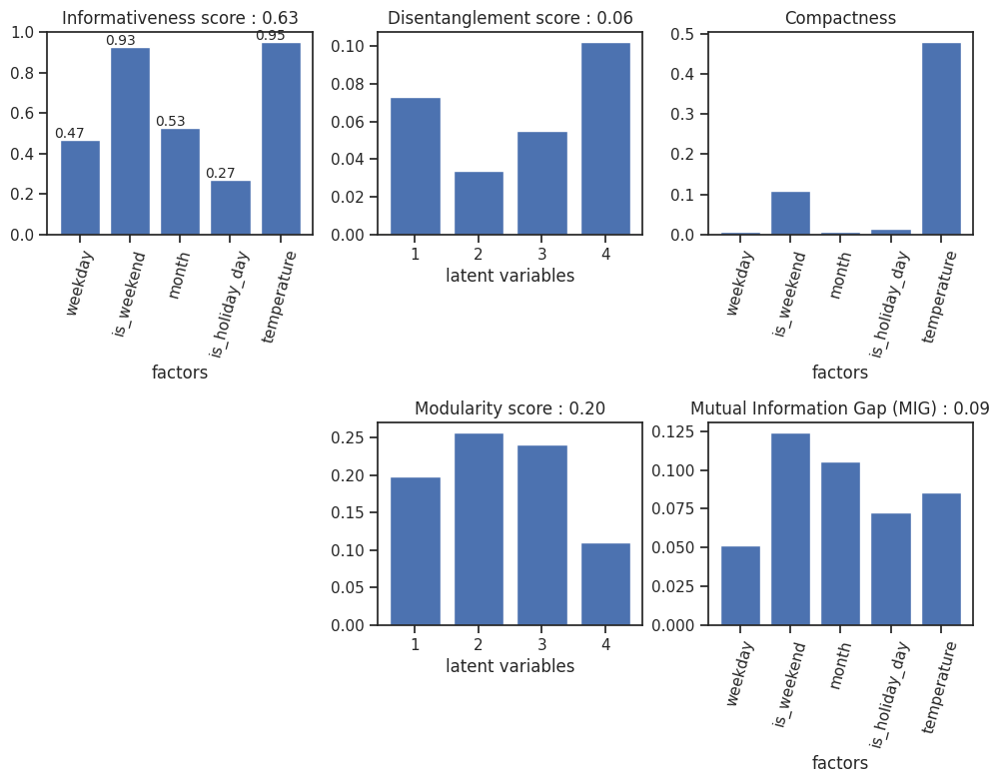

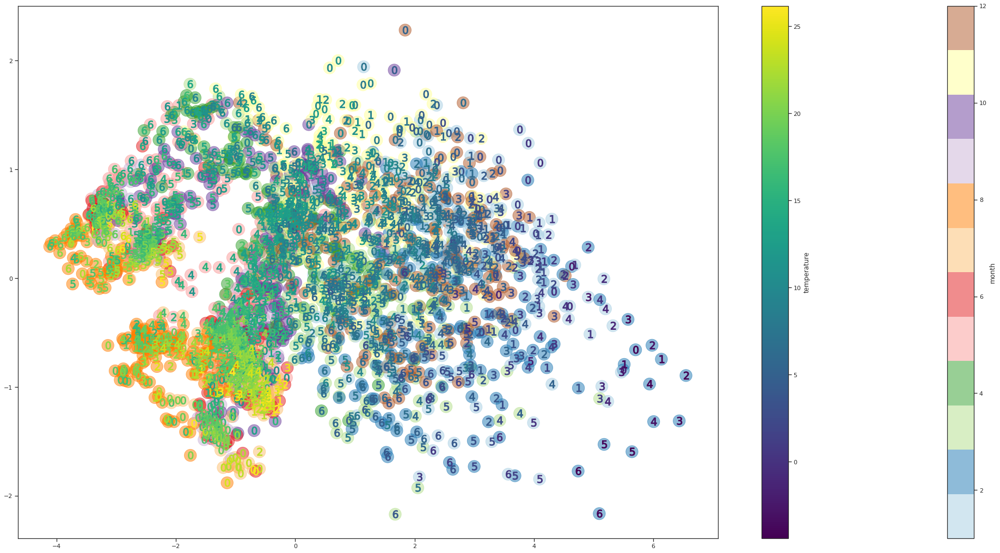

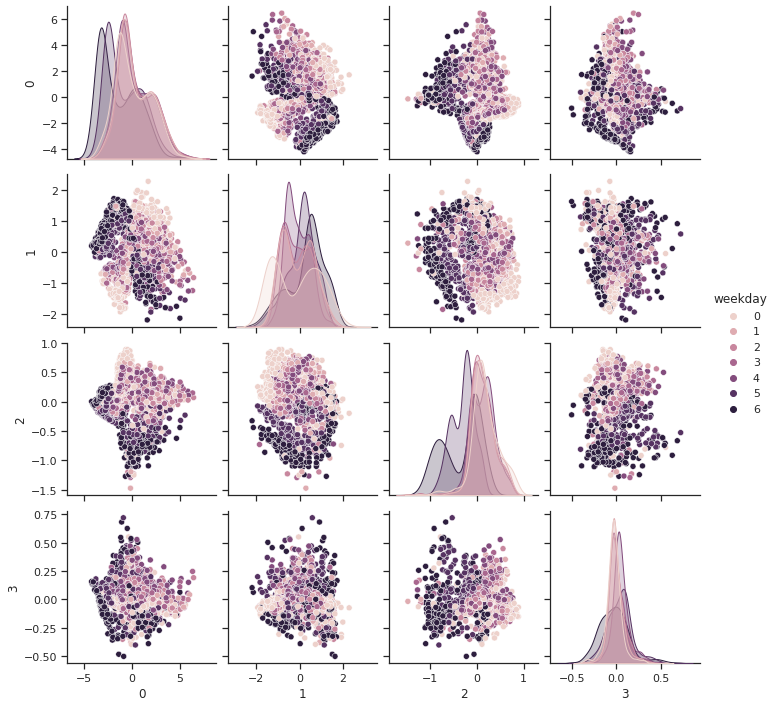

In [89]:
plot_intel(cvae_pca, input_cvae_pca)

In [90]:
dec_inputs = Input(shape=(cvae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(cvae.VAE_params.model_params.decoder_dims):
    if (idx<len(cvae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    
decoder_pca_first = Model(inputs=dec_inputs, outputs=x, name=name_model+'pca_dec')

In [91]:
from tensorflow.keras import losses

optimizer = cvae.VAE_params.training_params.optimizer(cvae.VAE_params.training_params.lr)

decoder_pca_first.compile(loss=cvae.VAE_params.training_params.loss.losses["recon_loss"],
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)

training_history_pca_first = decoder_pca_first.fit(x_encoded_pca, input_cvae_pca, epochs= 1000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/1000
144/144 [==============================] - 1s 2ms/step - loss: 15.3490 - val_loss: 11.2400
Epoch 2/1000
144/144 [==============================] - 0s 1ms/step - loss: 14.5558 - val_loss: 10.5077
Epoch 3/1000
144/144 [==============================] - 0s 2ms/step - loss: 13.7377 - val_loss: 9.4104
Epoch 4/1000
144/144 [==============================] - 0s 2ms/step - loss: 12.6400 - val_loss: 7.9531
Epoch 5/1000
144/144 [==============================] - 0s 2ms/step - loss: 11.2231 - val_loss: 6.1573
Epoch 6/1000
144/144 [==============================] - 0s 2ms/step - loss: 9.4120 - val_loss: 4.1841
Epoch 7/1000
144/144 [==============================] - 0s 2ms/step - loss: 7.2399 - val_loss: 2.5504
Epoch 8/1000
144/144 [==============================] - 0s 2ms/step - loss: 5.0562 - val_loss: 1.4932
Epoch 9/1000
144/144 [==============================] - 0s 2ms/step - loss: 3.1201 - val_loss: 0.9003
Epoch 10/1000
144/144 [==============================] - 0s 2ms/step - loss

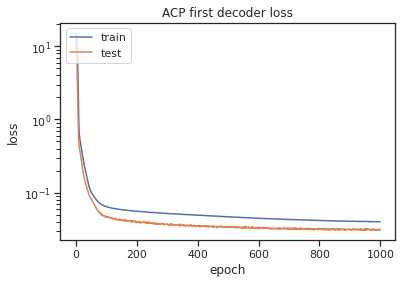

In [92]:
plt.plot(training_history_pca_first.history['loss'])
plt.plot(training_history_pca_first.history['val_loss'])
plt.title('ACP first decoder loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [93]:
dec_inputs = Input(shape=(cvae.VAE_params.model_params.latent_dims,), name="dec_input_"+name_model)
x = dec_inputs
for idx, layer_dim in enumerate(cvae.VAE_params.model_params.decoder_dims):
    if (idx<len(cvae.VAE_params.model_params.decoder_dims)-1):
        x = Dense(units=layer_dim, activation='relu',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    else: 
        x = Dense(units=layer_dim, activation='linear',
                    name="2nd_decoder_dense_{}".format(idx),
                    kernel_initializer=cvae.VAE_params.model_params.kernel_initializer,
                    bias_initializer = cvae.VAE_params.model_params.bias_initializer)(x)
    
decoder_pca_first2 = Model(inputs=dec_inputs, outputs=x, name=name_model+'pca_dec2')

In [94]:
from tensorflow.keras import losses

optimizer = cvae.VAE_params.training_params.optimizer(cvae.VAE_params.training_params.lr)

decoder_pca_first2.compile(loss=cvae.VAE_params.training_params.loss.losses["recon_loss"],
                           loss_weights=1,
                           optimizer=optimizer, experimental_run_tf_function=False)
earl_stop = EarlyStopping(
    monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True
)
pca2 = PCA(n_components=z_dim)
pca_x_encoded_pca = pca2.fit_transform(x_encoded_pca)
training_history_pca_first2 = decoder_pca_first2.fit(pca_x_encoded_pca, input_cvae_pca, epochs= 1000, verbose=1,
        batch_size=batch_size, callbacks=[earl_stop], validation_split = 0.1)

Epoch 1/1000
144/144 [==============================] - 1s 6ms/step - loss: 14.6651 - val_loss: 10.9334
Epoch 2/1000
144/144 [==============================] - 0s 1ms/step - loss: 14.1966 - val_loss: 10.4825
Epoch 3/1000
144/144 [==============================] - 0s 2ms/step - loss: 13.6866 - val_loss: 9.9321
Epoch 4/1000
144/144 [==============================] - 0s 2ms/step - loss: 12.9990 - val_loss: 9.0923
Epoch 5/1000
144/144 [==============================] - 0s 2ms/step - loss: 11.9255 - val_loss: 7.7578
Epoch 6/1000
144/144 [==============================] - 0s 2ms/step - loss: 10.1937 - val_loss: 5.7819
Epoch 7/1000
144/144 [==============================] - 0s 2ms/step - loss: 7.8654 - val_loss: 3.7358
Epoch 8/1000
144/144 [==============================] - 0s 2ms/step - loss: 5.4073 - val_loss: 2.1350
Epoch 9/1000
144/144 [==============================] - 0s 2ms/step - loss: 3.2100 - val_loss: 1.1884
Epoch 10/1000
144/144 [==============================] - 0s 2ms/step - los

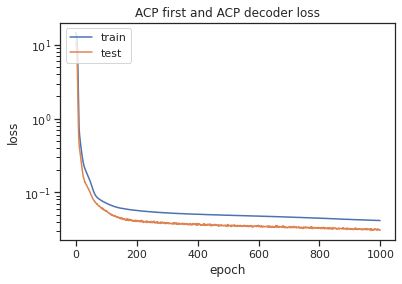

In [95]:
plt.plot(training_history_pca_first2.history['loss'])
plt.plot(training_history_pca_first2.history['val_loss'])
plt.title('ACP first and ACP decoder loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## <font color='DarkOrange'>7. Comparaisons et conclusions</font>

In [101]:
x_hat = cvae.model.predict(input_cvae)
x_hat_2dec = decoder_initial2.predict(x_encoded)
x_hat_enc_blocked = intel_cvae2.model.predict(input_cvae)
x_hat_pca = decoder_pca.predict(z_pca)
x_hat_tsne = decoder_tsne.predict(z_tsne)
x_hat_pca_first = pca_first.inverse_transform(decoder_pca_first.predict(x_encoded_pca))
x_hat_pca_first2 = pca_first.inverse_transform(decoder_pca_first2.predict(pca_x_encoded_pca))

print(f"Reconstruction error (RMSE) train for CVAE: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])))} MW")
print(f"Reconstruction error (MAE) train for CVAE: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} MW")
print(f"Reconstruction error (MAPE) train for CVAE: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])/df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} %")
print('')
print(f"Reconstruction error (RMSE) train with 2nd decoder: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_2dec).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])))} MW")
print(f"Reconstruction error (MAE) train with 2nd decoder: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_2dec).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} MW")
print(f"Reconstruction error (MAPE) train with 2nd decoder: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_2dec).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])/df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} %")
print('')
print(f"Reconstruction error (RMSE) train for CVAE with encoder blocked: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_enc_blocked).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])))} MW")
print(f"Reconstruction error (MAE) train for CVAE with encoder blocked: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_enc_blocked).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} MW")
print(f"Reconstruction error (MAPE) train for CVAE with encoder blocked: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_enc_blocked).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])/df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} %")
print('')
print(f"Reconstruction error (RMSE) train with PCA decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_pca).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])))} MW")
print(f"Reconstruction error (MAE) train with PCA decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} MW")
print(f"Reconstruction error (MAPE) train with PCA decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])/df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} %")
print('')
print(f"Reconstruction error (RMSE) train with t-SNE decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_tsne).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])))} MW")
print(f"Reconstruction error (MAE) train with t-SNE decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_tsne).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} MW")
print(f"Reconstruction error (MAPE) train with t-SNE decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_tsne).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])/df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} %")
print('')
print(f"Reconstruction error (RMSE) train with PCA First decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_pca_first).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])))} MW")
print(f"Reconstruction error (MAE) train with PCA First decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} MW")
print(f"Reconstruction error (MAPE) train with PCA First decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_first).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])/df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} %")
print('')
print(f"Reconstruction error (RMSE) train with PCA First and PCA decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_pca_first2).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])))} MW")
print(f"Reconstruction error (MAE) train with PCA First and PCA decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first2).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} MW")
print(f"Reconstruction error (MAPE) train with PCA First and PCA decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_first2).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018])/df_data.Consommation.values[df_data.utc_datetime.dt.year <= 2018]))} %")

Reconstruction error (RMSE) train for CVAE: 1554.4455971121463 MW
Reconstruction error (MAE) train for CVAE: 1191.854764574091 MW
Reconstruction error (MAPE) train for CVAE: 2.232400654767858 %

Reconstruction error (RMSE) train with 2nd decoder: 795.717917924728 MW
Reconstruction error (MAE) train with 2nd decoder: 573.9713174389543 MW
Reconstruction error (MAPE) train with 2nd decoder: 1.0585264629248787 %

Reconstruction error (RMSE) train for CVAE with encoder blocked: 1501.696093164043 MW
Reconstruction error (MAE) train for CVAE with encoder blocked: 1148.9652656094686 MW
Reconstruction error (MAPE) train for CVAE with encoder blocked: 2.1528417757909732 %

Reconstruction error (RMSE) train with PCA decoding: 827.1126799160372 MW
Reconstruction error (MAE) train with PCA decoding: 603.3406702826595 MW
Reconstruction error (MAPE) train with PCA decoding: 1.1195491838051033 %

Reconstruction error (RMSE) train with t-SNE decoding: 948.808981056159 MW
Reconstruction error (MAE) trai

In [102]:
test_input_cvae = [df_conso.values[test_set,:]]
test_z_pca = pca.transform(cvae.encoder.predict(test_input_cvae)[0])

In [103]:
index = pd.DataFrame(pd.date_range("00:00", "23:30", freq="30min")).apply(lambda x:str(x)[15:20], axis=1)
index = index.values
index[0]= '00:00'

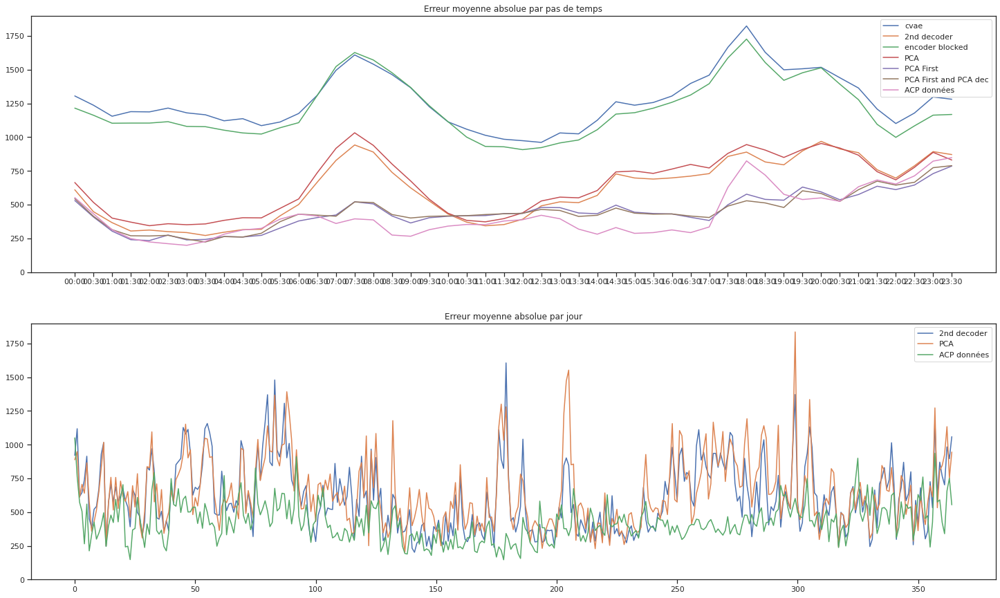

In [125]:
x_encoded_test = cvae.encoder.predict(test_input_cvae)[0]
test_z_pca = pca.transform(x_encoded_test)
#test_z_tsne = TSNE(z_dim, method='exact').fit_transform(x_encoded_test)
pca_first = PCA(n_components=48)
pca_first.fit(input_cvae[0])
input_cvae_pca_test = pca_first.transform(test_input_cvae[0])
pca_comparaison = PCA(n_components=z_dim)
pca_comparaison.fit(input_cvae[0])
comparaison = pca_comparaison.inverse_transform(pca_comparaison.transform(test_input_cvae[0]))
x_encoded_pca_test = cvae_pca.encoder.predict(input_cvae_pca_test)[0]
pca_x_encoded_pca_test = pca2.transform(x_encoded_pca_test)

x_hat_test = cvae.model.predict(test_input_cvae)
x_hat_2dec_test = decoder_initial2.predict(x_encoded_test)
x_hat_enc_blocked_test = intel_cvae2.model.predict(test_input_cvae)
x_hat_pca_test = decoder_pca.predict(test_z_pca)
#x_hat_tsne_test = decoder_tsne.predict(test_z_tsne)
x_hat_pca_first_test = pca_first.inverse_transform(decoder_pca_first.predict(x_encoded_pca_test))
x_hat_pca_first2_test = pca_first.inverse_transform(decoder_pca_first2.predict(pca_x_encoded_pca_test))

cvae_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
cvae_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=1)
#print(f"Reconstruction error (MAPE) test for CVAE: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48))/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)))} %")
print('')
dec2_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_2dec_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
dec2_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_2dec_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=1)
#print(f"Reconstruction error (MAPE) test with 2nd decoder: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_2dec_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48))/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)))} %")
print('')
blocked_enc_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_enc_blocked_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
blocked_enc_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_enc_blocked_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=1)
#print(f"Reconstruction error (MAPE) test for CVAE with encoder blocked: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_enc_blocked_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48))/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)))} %")
print('')
pca_dec_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
pca_dec_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=1)
#print(f"Reconstruction error (MAPE) test with PCA decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48))/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)))} %")
print('')
#tsne_dec_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_tsne_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
#tsne_dec_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_tsne_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=1)
#print(f"Reconstruction error (MAPE) test with t-SNE decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_tsne_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48))/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)))} %")
pcafirst_dec_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)), axis=0)
pcafirst_dec_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)), axis=1)
#print(f"Reconstruction error (MAPE) test with PCA First decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_first_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48))/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)))} %")
print('')
pcafirst_pcadec_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first2_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
pcafirst_pcadec_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first2_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=1)
#print(f"Reconstruction error (MAPE) test with PCA First and PCA decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_first2_test) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48))/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)))} %")
comparaison_hourerror = np.mean(np.abs(conso_scaler.inverse_transform(comparaison) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=0)
comparaison_dayerror = np.mean(np.abs(conso_scaler.inverse_transform(comparaison) - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48)),axis=1)

fig, axs = plt.subplots(2,1,figsize=(25,15))

axs[0].plot(index,cvae_hourerror, label='cvae')
axs[0].plot(index,dec2_hourerror, label='2nd decoder')
axs[0].plot(index,blocked_enc_hourerror, label='encoder blocked')
axs[0].plot(index,pca_dec_hourerror, label='PCA')
#plt.plot(tsne_dec_error, label='t-SNE dec')
axs[0].plot(index,pcafirst_dec_hourerror, label='PCA First')
axs[0].plot(index,pcafirst_pcadec_hourerror, label='PCA First and PCA dec')
axs[0].plot(index,comparaison_hourerror, label='ACP données')
axs[0].legend()
axs[0].set(ylim=(0,1900))
axs[0].set_title('Erreur moyenne absolue par pas de temps')


#axs[1].plot(cvae_dayerror, label='cvae')
axs[1].plot(dec2_dayerror, label='2nd decoder')
#axs[1].plot(blocked_enc_dayerror, label='encoder blocked')
axs[1].plot(pca_dec_dayerror, label='PCA')
axs[1].plot(comparaison_dayerror, label='ACP données')
#plt.plot(tsne_dec_error, label='t-SNE dec')
#axs[1].plot(pcafirst_dec_dayerror, label='PCA First')
#axs[1].plot(pcafirst_pcadec_dayerror, label='PCA First and PCA dec')
axs[1].legend()
axs[1].set(ylim=(0,1900))
axs[1].set_title('Erreur moyenne absolue par jour')
plt.show()

df = pd.DataFrame(data={'day':pd.date_range(start='1/1/2019', end='31/12/2019'),
                        '2nd dec': dec2_dayerror,
                        'PCA': pca_dec_dayerror,
                        'PCA First': comparaison_dayerror,
                        'holiday': df_calendar[df_calendar.year == 2019]['is_holiday_day']})
df['month']=df.day.apply(lambda x: x.month)

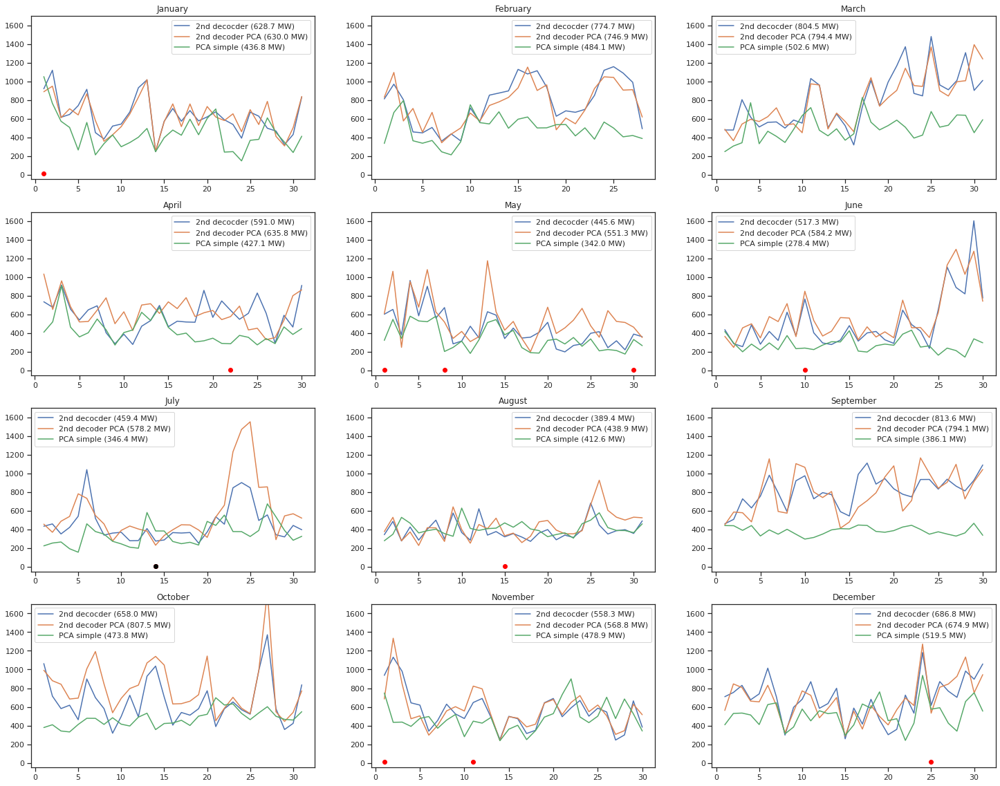

In [126]:
months = ['January', 'February', 'March','April', 'May', 'June', 'July', 'August','September','October','November', 'December']
fig, axs = plt.subplots(4,3,figsize=(25,20))
for i in range(4):
    for j in range(3):
        holiday = df[df.month == 3*i+j+1]['holiday']
        holiday_mask = np.ma.masked_where(holiday < [1.]*holiday.shape[0], 10*holiday)
        holiday_weekend = holiday * df_calendar[(df_calendar.month == 3*i+j+1) & (df_calendar.year==2019)]['is_weekend'].astype(float).values
        holiday_weekend_mask = np.ma.masked_where(holiday_weekend < [1.]*holiday_weekend.shape[0], 10*holiday_weekend)
        axs[i][j].plot(np.arange(1,df[df.month == 3*i+j+1]['PCA'].shape[0]+1),df[df.month == 3*i+j+1]['2nd dec'], label=f"2nd decocder ({round(df[df.month == 3*i+j+1]['2nd dec'].mean(),1)} MW)")
        axs[i][j].plot(np.arange(1,df[df.month == 3*i+j+1]['PCA'].shape[0]+1),df[df.month == 3*i+j+1]['PCA'], label=f"2nd decoder PCA ({round(df[df.month == 3*i+j+1]['PCA'].mean(),1)} MW)")
        axs[i][j].plot(np.arange(1,df[df.month == 3*i+j+1]['PCA First'].shape[0]+1),df[df.month == 3*i+j+1]['PCA First'], label=f"PCA simple ({round(df[df.month == 3*i+j+1]['PCA First'].mean(),1)} MW)")
        axs[i][j].scatter(np.arange(1,df_calendar[(df_calendar.month == 3*i+j+1) & (df_calendar.year==2019)]['is_holiday_day'].shape[0]+1),holiday_mask, color='red')
        axs[i][j].scatter(np.arange(1,df_calendar[(df_calendar.month == 3*i+j+1) & (df_calendar.year==2019)]['is_holiday_day'].shape[0]+1),holiday_weekend_mask, color='black')
        axs[i][j].legend()
        axs[i][j].set(ylim=(-50,1700))
        axs[i][j].set_title(months[3*i+j])

### Regardons où ces modèles se sont trompés le plus 

In [63]:
x_encoded_test = cvae.encoder.predict(test_input_cvae)[0]
test_z_pca = pca.transform(x_encoded_test)
test_z_tsne = TSNE(z_dim, method='exact').fit_transform(x_encoded_test)
pca_first = PCA(n_components=48)
pca_first.fit(input_cvae[0])
input_cvae_pca_test = pca_first.transform(test_input_cvae[0])
x_encoded_pca_test = cvae_pca.encoder.predict(input_cvae_pca_test)[0]
pca_x_encoded_pca_test = pca2.transform(x_encoded_pca_test)

x_hat_test = cvae.model.predict(test_input_cvae)
x_hat_2dec_test = decoder_initial2.predict(x_encoded_test)
x_hat_enc_blocked_test = intel_cvae2.model.predict(test_input_cvae)
x_hat_pca_test = decoder_pca.predict(test_z_pca)
x_hat_tsne_test = decoder_tsne.predict(test_z_tsne)
x_hat_pca_first_test = decoder_pca_first.predict(x_encoded_pca_test)
x_hat_pca_first2_test = decoder_pca_first2.predict(pca_x_encoded_pca_test)

print(f"Reconstruction error (RMSE) test for CVAE: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])))} MW")
print(f"Reconstruction error (MAE) test for CVAE: {np.abs(conso_scaler.inverse_transform(x_hat_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]).shape}")
print(f"Reconstruction error (MAPE) test for CVAE: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} %")
print('')
print(f"Reconstruction error (RMSE) test with 2nd decoder: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_2dec_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])))} MW")
print(f"Reconstruction error (MAE) test with 2nd decoder: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_2dec_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} MW")
print(f"Reconstruction error (MAPE) test with 2nd decoder: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_2dec_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} %")
print('')
print(f"Reconstruction error (RMSE) test for CVAE with encoder blocked: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_enc_blocked_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])))} MW")
print(f"Reconstruction error (MAE) test for CVAE with encoder blocked: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_enc_blocked_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} MW")
print(f"Reconstruction error (MAPE) test for CVAE with encoder blocked: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_enc_blocked_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} %")
print('')
print(f"Reconstruction error (RMSE) test with PCA decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_pca_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])))} MW")
print(f"Reconstruction error (MAE) test with PCA decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} MW")
print(f"Reconstruction error (MAPE) test with PCA decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} %")
print('')
print(f"Reconstruction error (RMSE) test with t-SNE decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_tsne_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])))} MW")
print(f"Reconstruction error (MAE) test with t-SNE decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_tsne_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} MW")
print(f"Reconstruction error (MAPE) test with t-SNE decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_tsne_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} %")
print('')
print(f"Reconstruction error (RMSE) test with PCA First decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_pca_first_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])))} MW")
print(f"Reconstruction error (MAE) test with PCA First decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} MW")
print(f"Reconstruction error (MAPE) test with PCA First decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_first_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} %")
print('')
print(f"Reconstruction error (RMSE) test with PCA First and PCA decoding: {np.sqrt(np.mean(np.square(conso_scaler.inverse_transform(x_hat_pca_first2_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])))} MW")
print(f"Reconstruction error (MAE) test with PCA First and PCA decoding: {np.mean(np.abs(conso_scaler.inverse_transform(x_hat_pca_first2_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} MW")
print(f"Reconstruction error (MAPE) test with PCA First and PCA decoding: {100*np.mean(np.abs((conso_scaler.inverse_transform(x_hat_pca_first2_test).ravel() - df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019])/df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019]))} %")

Reconstruction error (RMSE) test for CVAE: 1592.7094062130766 MW
Reconstruction error (MAE) test for CVAE: (17520,)
Reconstruction error (MAPE) test for CVAE: 2.413598633242576 %

Reconstruction error (RMSE) test with 2nd decoder: 750.5811275048518 MW
Reconstruction error (MAE) test with 2nd decoder: 560.4778087319849 MW
Reconstruction error (MAPE) test with 2nd decoder: 1.0786368498276573 %

Reconstruction error (RMSE) test for CVAE with encoder blocked: 1561.6079669091264 MW
Reconstruction error (MAE) test for CVAE with encoder blocked: 1215.5724818956905 MW
Reconstruction error (MAPE) test for CVAE with encoder blocked: 2.335473084631049 %

Reconstruction error (RMSE) test with PCA decoding: 739.9688272657946 MW
Reconstruction error (MAE) test with PCA decoding: 555.9054432211401 MW
Reconstruction error (MAPE) test with PCA decoding: 1.0629516982026408 %

Reconstruction error (RMSE) test with t-SNE decoding: 51702.78089965231 MW
Reconstruction error (MAE) test with t-SNE decoding: 3

In [70]:
df_data.Consommation.values[df_data.utc_datetime.dt.year == 2019].reshape(365,48).mean(axis=0)

(48,)

In [60]:
def plot_sample(day):
    inp = conso_scaler.inverse_transform(input_cvae[0][day].reshape(-1,1))
    out = conso_scaler.inverse_transform(x_hat[day].reshape(-1,1))
    out_2dec = conso_scaler.inverse_transform(x_hat_2dec[day].reshape(-1,1))
    out_enc_blocked = conso_scaler.inverse_transform(x_hat_enc_blocked[day].reshape(-1,1))
    out_pca = conso_scaler.inverse_transform(x_hat_pca[day].reshape(-1,1))
    out_tsne = conso_scaler.inverse_transform(x_hat_tsne[day].reshape(-1,1))
    out_pca_first = conso_scaler.inverse_transform(x_hat_pca_first[day].reshape(-1,1))

    plt.figure(figsize=(20,12))
    plt.plot(inp, label='Electrical consumption sample')
    plt.plot(out_2dec, label='Reconstruction with a second decoder')
    plt.plot(out_pca, label='Reconstruction with PCA decoding')
    plt.plot(out_pca_first, label='Reconstruction with PCA before CVAE training')
    plt.legend()
    plt.title('Jour: '+str(df_calendar['ds'].iloc[day]).split(' ')[0])
    plt.show()

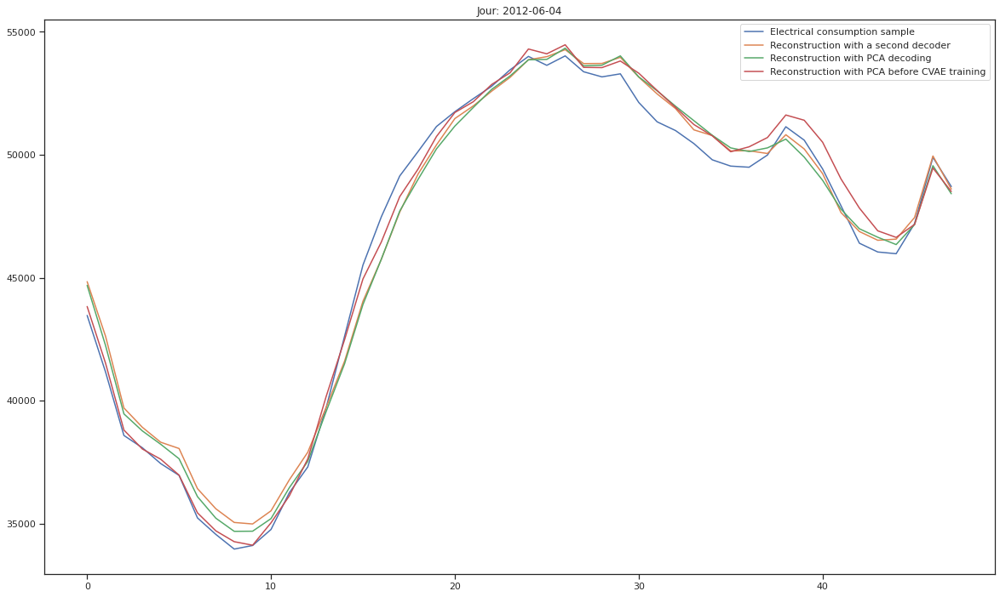

In [61]:
plot_sample(155)

**Résultats**:
- Diminution de l'erreur absolue moyenne d'un facteur 2 sur le jeu de données d'entraînement
- Explosion de l'erreur absolue moyenne sur le jeu de données de test. 

**Explications**:
- La classe TSNE du package *scikit-learn* ne possède pas de méthode *transform*.
- Afin de transformer les nouvelles données de test avec le t-SNE, il faut alors réapprendre un nouveau t-SNE avec ces données et ensuite les transformer. Les distributions apprises par le précédent et le nouveau t-SNE n'étant plus identiques (car apprises sur des données différentes), le décodage n'est pas bon. 

## <font color='DarkOrange'>8. Aggréger les résultats obtenus à travers les différents apprentissages de nos modèles</font>

<AxesSubplot:title={'center':'Moyennes des RMSE de reconstruction obtenues à partir de 5 apprentissages, pour chaque modèle'}, xlabel='Modèles'>

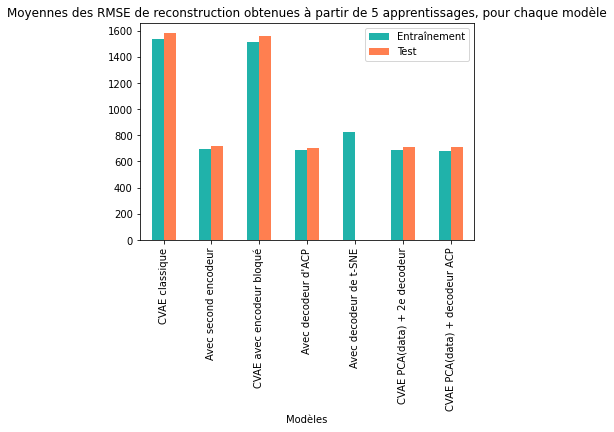

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
  
# Création du DataFrame contenant les moyennes des scores obtenus à travers les apprentissages

rmse = pd.DataFrame([['CVAE classique', 1537.002, 1581.516], ['Avec second encodeur', 694.205, 716.25], ['CVAE avec encodeur bloqué', 1511.78, 1560.69],
                   ["Avec decodeur d'ACP",686.21, 701.8], ["Avec decodeur de t-SNE",827.84,0], ["CVAE PCA(data) + 2e decodeur", 686.33, 713.986],
                   ["CVAE PCA(data) + decodeur ACP", 680.63, 713.18]],
                  columns=['Modèles', 'Entraînement', 'Test'])

# plot data in stack manner of bar type
rmse.plot(x='Modèles', kind='bar', stacked=False,
        title="Moyennes des RMSE de reconstruction obtenues à partir de 5 apprentissages, pour chaque modèle",
        color={"Entraînement": "lightseagreen", "Test": "coral"})

<AxesSubplot:title={'center':'Moyennes des MAE de reconstruction obtenues à partir de 5 apprentissages, pour chaque modèle'}, xlabel='Modèles'>

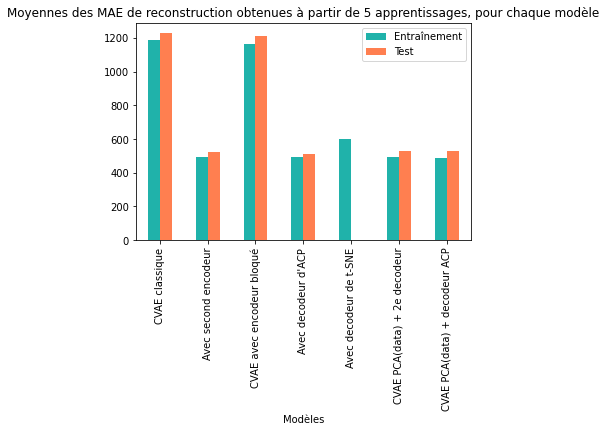

In [19]:
# Création du DataFrame contenant les moyennes des scores obtenus à travers les apprentissages

mae = pd.DataFrame([['CVAE classique', 1187.516, 1228.788], ['Avec second encodeur', 495.33, 525.4], ['CVAE avec encodeur bloqué', 1164.79,1210.98],
                   ["Avec decodeur d'ACP",490.499, 513.07], ["Avec decodeur de t-SNE",598.22,0], ["CVAE PCA(data) + 2e decodeur", 491.46, 526.61],
                   ["CVAE PCA(data) + decodeur ACP", 485.52, 525.47]],
                  columns=['Modèles', 'Entraînement', 'Test'])

# plot data in stack manner of bar type
mae.plot(x='Modèles', kind='bar', stacked=False,
        title="Moyennes des MAE de reconstruction obtenues à partir de 5 apprentissages, pour chaque modèle",
        color={"Entraînement": "lightseagreen", "Test": "coral"})

<AxesSubplot:title={'center':'Moyennes des MAPE de reconstruction obtenues à partir de 5 apprentissages, pour chaque modèle'}, xlabel='Modèles'>

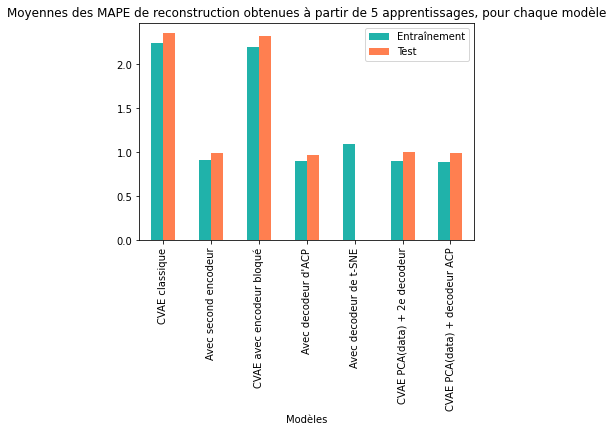

In [21]:
# Création du DataFrame contenant les moyennes des scores obtenus à travers les apprentissages

mape = pd.DataFrame([['CVAE classique', 2.243, 2.3566], ['Avec second encodeur', 0.908, 0.992], ['CVAE avec encodeur bloqué', 2.198, 2.32],
                   ["Avec decodeur d'ACP",0.9002, 0.966], ["Avec decodeur de t-SNE",1.097,0], ["CVAE PCA(data) + 2e decodeur", 0.905, 0.997],
                   ["CVAE PCA(data) + decodeur ACP", 0.891, 0.992]],
                  columns=['Modèles', 'Entraînement', 'Test'])

# plot data in stack manner of bar type
mape.plot(x='Modèles', kind='bar', stacked=False,
        title="Moyennes des MAPE de reconstruction obtenues à partir de 5 apprentissages, pour chaque modèle",
        color={"Entraînement": "lightseagreen", "Test": "coral"})

<b>Conclusion</b>: 

- La transformation latente à l'aide d'un t-SNE n'est pas possible
- Les meilleurs résultats sont obtenus avec le second décodeur que ce soit sur l'Info-VAE appris sur les données brutes ou celui sur les données orthoganlisées à l'aide d'une ACP. 
- Le modèle du secon décodeur s'avère être un bon atout pour la diminution de l'erreur de reconstruction. 